To run an unsupervised classification on satellite data using Python you need GDAL, Numpy and Sklearn. If you wish to see the data you will also need Matplotlib. Assuming you have the libraries installed, import them at the start.
<br>
<br>
Lets start with a single band image

In [1]:
import numpy as np
from sklearn import cluster
from osgeo import gdal, gdal_array

# Tell GDAL to throw Python exceptions, and register all drivers
gdal.UseExceptions()
gdal.AllRegister()

# Read in raster image 
img_ds = gdal.Open('Raster_Classified\S2B_MSIL2A_20250130T033909_N0511_R061_T47PPS_20250130T063218.tif', gdal.GA_ReadOnly)

band = img_ds.GetRasterBand(2)

img = band.ReadAsArray()
print (img.shape)

X = img.reshape((-1,1))
print (X.shape)


k_means = cluster.KMeans(n_clusters=50, max_iter=50, random_state=42)
k_means.fit(X)

X_cluster = k_means.labels_
X_cluster = X_cluster.reshape(img.shape)

print (len(X_cluster))

(10980, 10980)
(120560400, 1)
10980


Plot the classified image

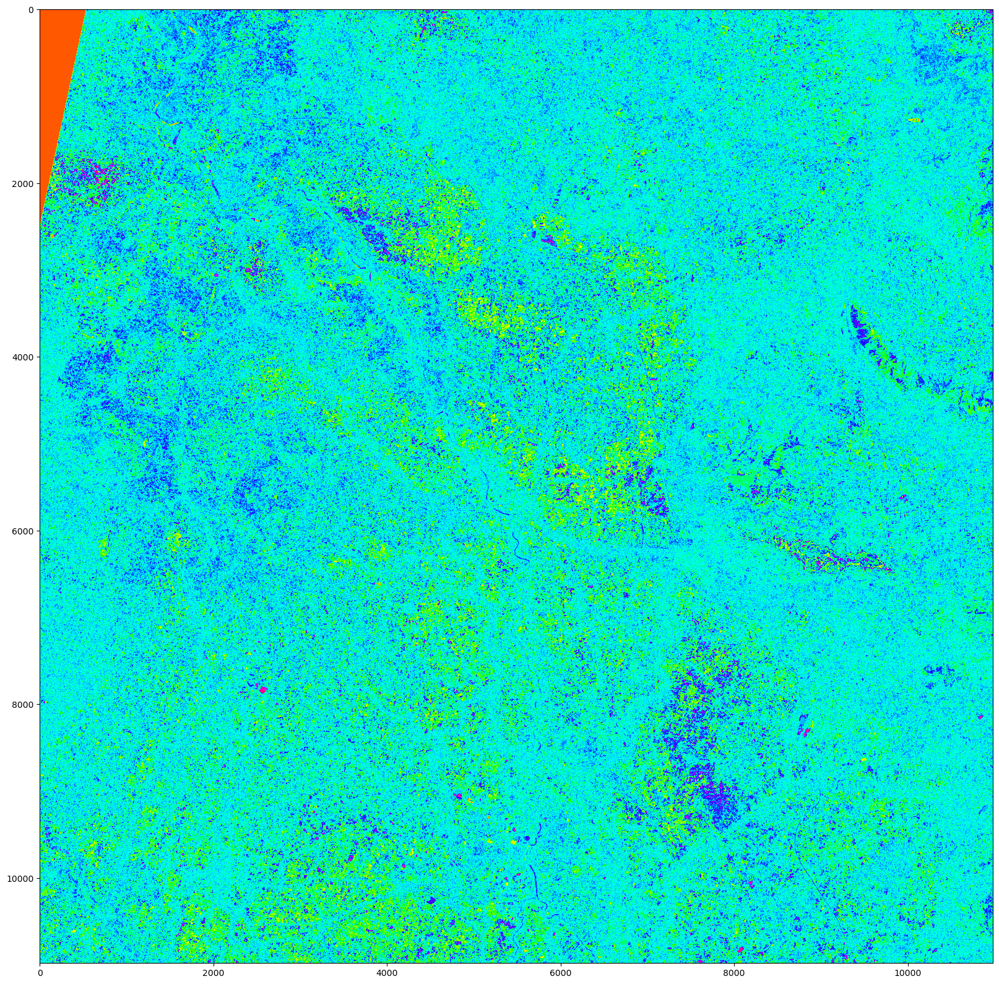

In [2]:
%matplotlib inline  

import matplotlib.pyplot as plt

plt.figure(figsize=(20,20))
plt.imshow(X_cluster, cmap="hsv")

plt.show()

What about using all 10 bands and Index of Sentinel 2?

In [3]:
import numpy as np
# Tell GDAL to throw Python exceptions, and register all drivers
gdal.UseExceptions()
gdal.AllRegister()

# Read in raster image 
img_ds = gdal.Open('Raster_Classified\S2B_MSIL2A_20250130T033909_N0511_R061_T47PPS_20250130T063218.tif', gdal.GA_ReadOnly)


img = np.zeros((img_ds.RasterYSize, img_ds.RasterXSize, img_ds.RasterCount),
               gdal_array.GDALTypeCodeToNumericTypeCode(img_ds.GetRasterBand(1).DataType))

for b in range(img.shape[2]):
    img[:, :, b] = img_ds.GetRasterBand(b + 1).ReadAsArray()
    
new_shape = (img.shape[0] * img.shape[1], img.shape[2])
print (img.shape)

print (new_shape)


X = img[:, :, :14].reshape(new_shape)

print (X.shape)

(10980, 10980, 14)
(120560400, 14)
(120560400, 14)


### Using the Elbow Method to finding Optimal K Value

In [ ]:
from sklearn.cluster import KMeans

inertias = []
for i in range(30, 51):
    kmeans = KMeans(n_clusters=i, max_iter=50, random_state=42)
    kmeans.fit(X)
    inertias.append(kmeans.inertia_)

plt.plot(range(1,11), inertias, marker='o')
plt.title('Elbow method')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')
plt.show()

Now fit it

In [4]:
from sklearn.impute import SimpleImputer
import numpy as np

# Fill NaN with a placeholder (e.g., 0)
X_filled = np.nan_to_num(X, nan=0)  # You can also use an imputer for a specific strategy

k_means = cluster.KMeans(n_clusters=50, max_iter=50, random_state=42)
k_means.fit(X_filled)

X_cluster = k_means.labels_

# Reshape back to match the original image dimensions
X_cluster = X_cluster.reshape(img[:, :, 0].shape)

And plot

(10980, 10980)


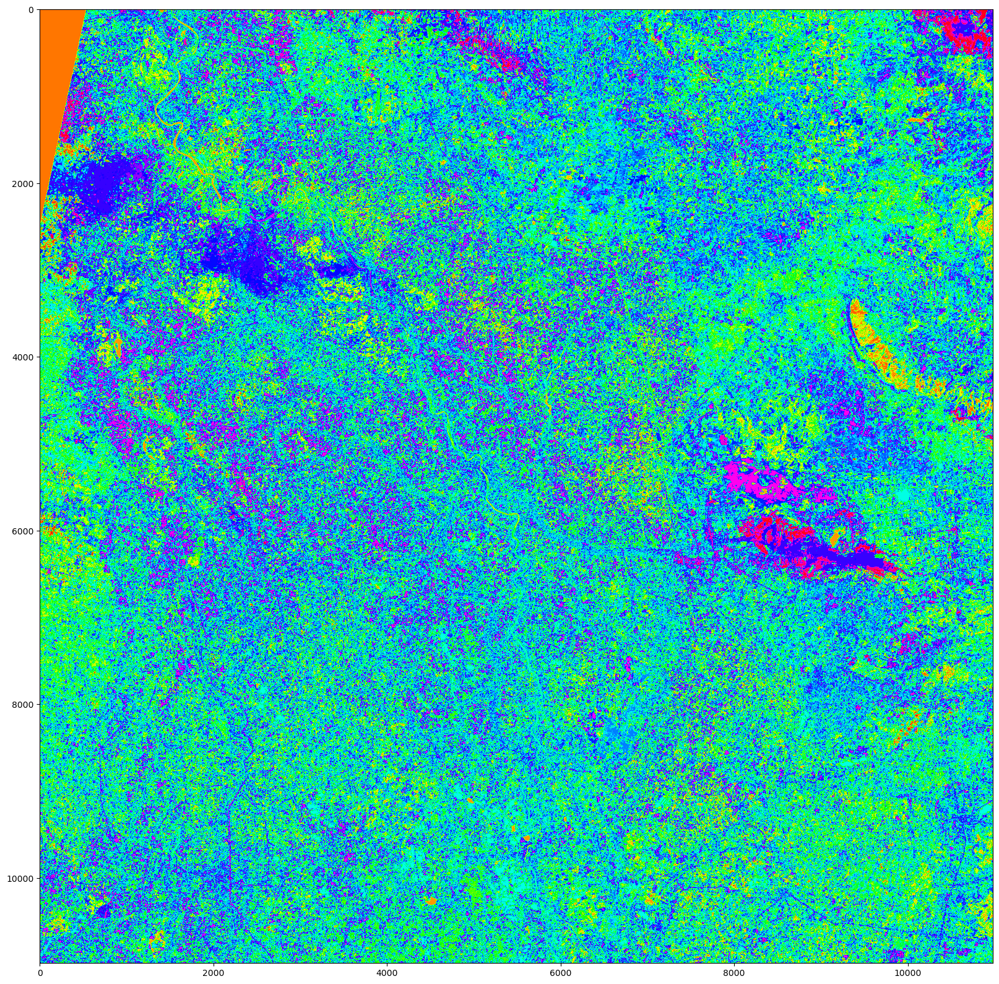

In [5]:
%matplotlib inline  

import matplotlib.pyplot as plt
print (X_cluster.shape)

plt.figure(figsize=(20,20))
plt.imshow(X_cluster, cmap="hsv")

plt.show()

Changing the classification is straight forward. In this example choose MiniBatchKMeans

In [6]:
MB_KMeans = cluster.MiniBatchKMeans(n_clusters=50, max_iter=50, random_state=42)
MB_KMeans.fit(X_filled)

X_cluster = MB_KMeans.labels_


X_cluster = X_cluster.reshape(img[:, :, 0].shape)

c:\Users\admin\anaconda3\envs\RIDA_env\lib\site-packages\sklearn\cluster\_kmeans.py:1955: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 6144 or by setting the environment variable OMP_NUM_THREADS=4
  warnings.warn(


Plot the result

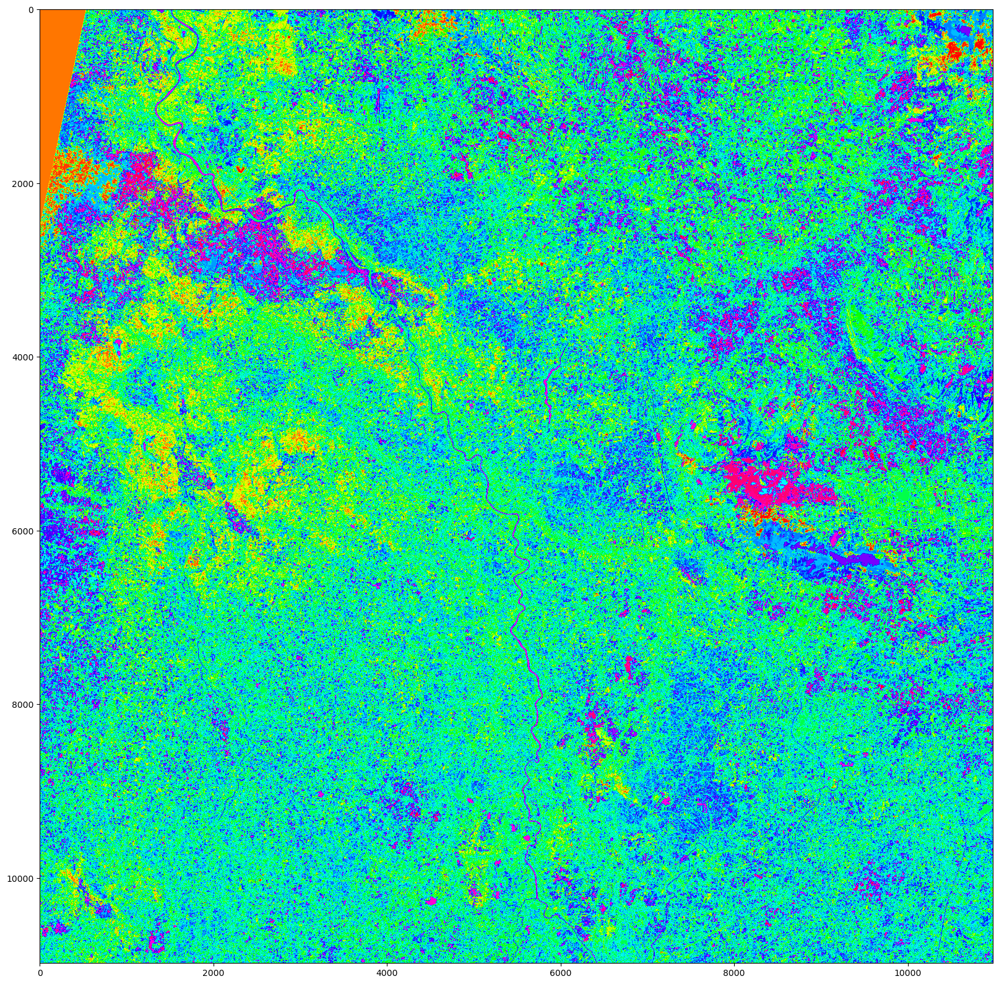

In [7]:
plt.figure(figsize=(20,20))
plt.imshow(X_cluster, cmap="hsv")

plt.show()

Final save the result to a bew geotiff

In [9]:
import os
from osgeo import gdal

# Define the source raster path
source_path = r"Raster_Classified\S2B_MSIL2A_20250130T033909_N0511_R061_T47PPS_20250130T063218.tif"

# Open the source raster
ds = gdal.Open(source_path)
band = ds.GetRasterBand(2)
arr = band.ReadAsArray()
rows, cols = arr.shape  # Ensure correct order

# Create output directory if it doesn't exist
output_dir = "clustered_result"
os.makedirs(output_dir, exist_ok=True)

# Extract filename dynamically and append "_clustered.tif"
filename = os.path.splitext(os.path.basename(source_path))[0] + "_clustered.tif"
output_path = os.path.join(output_dir, filename)

# Ensure X_cluster is defined before writing
if "X_cluster" not in locals():
    raise ValueError("X_cluster is not defined. Ensure clustering is performed before writing to raster.")

# Check shape compatibility
if X_cluster.shape != arr.shape:
    raise ValueError(f"Shape mismatch: X_cluster {X_cluster.shape} vs. Raster {arr.shape}")

# Create the output raster
driver = gdal.GetDriverByName("GTiff")
outDataRaster = driver.Create(output_path, cols, rows, 1, gdal.GDT_Byte)  # Ensure correct shape order
outDataRaster.SetGeoTransform(ds.GetGeoTransform())  # Copy geotransform
outDataRaster.SetProjection(ds.GetProjection())  # Copy projection

# Write the clustered data
outDataRaster.GetRasterBand(1).WriteArray(X_cluster)

# Save and close
outDataRaster.FlushCache()  # Remove from memory
del outDataRaster  # Delete dataset reference
del ds  # Close input dataset